# Intrinsic camera calibration 

In [1]:
import rosbag, rospy
from sensor_msgs.msg import Image, CameraInfo
from image_geometry import PinholeCameraModel
import tf

import cv2
from cv_bridge import CvBridge, CvBridgeError

import json, yaml
import glob, random, math
from scipy.optimize import minimize

%matplotlib inline
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import os, re

In [2]:
filename = '2017-04-19-15-38-28.bag'
bag = rosbag.Bag(filename)
n = bag.get_message_count(topic_filters='/image_raw')
print('Number of images : ', n)
info = bag.get_type_and_topic_info()
info.topics.keys()

('Number of images : ', 8678)


['/twist_cmd',
 '/velodyne_nodelet_manager/bond',
 '/radar/tracks',
 '/image_raw',
 '/steer_cmd',
 '/points_raw',
 '/velodyne_nodelet/parameter_descriptions',
 '/rosout',
 '/rosout_agg',
 '/velodyne_packets',
 '/brake_cmd',
 '/radar/points',
 '/velodyne_nodelet/parameter_updates',
 '/diagnostics',
 '/accel_cmd',
 '/radar/range']

In [3]:
save_dir = 'calib/'

# save calibration images
bridge = CvBridge()
img_index = 0
count = -1
with rosbag.Bag(filename, 'r') as bag:
    for topic, msg, t in bag.read_messages(topics='/image_raw'):
        count+=1
        if count%100 != 0 :
            continue
        try :
            cv_image = bridge.imgmsg_to_cv2(msg, "bgr8")
        except CvBridgeError, e:
            print e
        img_index += 1
        image_name = save_dir+str(img_index).zfill(3)+".jpg"
        cv2.imwrite(image_name, cv_image)  
        #print 'Saved '+image_name
print('Images saved')

Images saved


In [4]:
class calibration :
    def __init__(self, camera_matrix=None, dist_coefs=None) :
        self.images = {}
        self.nb_corners = {}
        self.images_with_corners = {}
        self.dim = None
        self.obj_points = None
        self.img_points = None   
        # load existing calibration if known
        self.camera_matrix = camera_matrix
        self.dist_coefs = dist_coefs
        
    def add_image(self, filename, nx, ny) :
        image = mpimg.imread(filename)
        if image is None :
            print("Failed to read {}".format(img))
        else :
            h,w = image.shape[:2]
            if not self.dim :
                self.dim = (w,h)
            else :
                if w!=self.dim[0] or h!=self.dim[1] :
                    print("Default image size is {}".format(self.dim))
                    print("whereas {} size is {}".format(filename, (w,h)))
                    print("Use with caution...")
            self.images[filename] = image
            self.nb_corners[filename] = (nx,ny)
            
    def plot_images(self, images) :
        ncols = 5
        nrows = max(2,int(np.ceil(len(images)/ncols)))
        fig, axes = plt.subplots(nrows,ncols, figsize=(ncols*4, nrows*3))
        for filename,ax in zip(images,axes.flatten()) : 
            ax.imshow(images[filename])
            ax.set_title(os.path.basename(filename))
        for ax in axes.flatten() : 
            ax.axis('off') 
            
    def display_images(self) :
        images = self.images
        self.plot_images(images)

    def display_images_with_corners(self) :
        self.find_corners(Display=True)
        images = self.images_with_corners
        self.plot_images(images)
        
        
            
    def find_corners(self, Display=False) :
        self.obj_points = []
        self.img_points = []
        self.images_with_corners = {}
        for filename, img in self.images.items() :
            nx,ny = self.nb_corners[filename]
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            found, corners = cv2.findChessboardCorners(gray, (nx, ny))
            if found:
                objp = np.zeros((nx*ny,3), np.float32)
                objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)
                self.obj_points.append(objp)
                self.img_points.append(corners)
                # Draw and display the corners
                if Display :
                    img_with_corners = np.copy(img)
                    cv2.drawChessboardCorners(img_with_corners, (nx, ny), corners, found)
                    self.images_with_corners[filename] = img_with_corners
            else :
                print("Corners not found in {}".format(filename))  
                
    def calc_distortion(self) :
        self.find_corners()
        # calculate camera distortion
        rms, self.camera_matrix, self.dist_coefs, rvecs, tvecs = cv2.calibrateCamera(self.obj_points, 
                                                                    self.img_points, self.dim, None, None)
        print("RMS:", rms)
        print("camera matrix:\n", self.camera_matrix)
        print("distortion coefficients: ", self.dist_coefs.ravel())
        
    def undistort_img(self, img) :
        assert (self.camera_matrix is not None) and (self.dist_coefs is not None), "Calibrate the camera first." 
        return cv2.undistort(img, self.camera_matrix, self.dist_coefs, None, self.camera_matrix)
        
    def display_undistorted_images(self,files=None) :
        dist = {}
        undist = {}
        if not files :
            files = self.images.keys()
        for filename in files :
            img = mpimg.imread(filename)
            dist[filename] = img
            undist[filename] = cv2.undistort(img, self.camera_matrix, self.dist_coefs, None, self.camera_matrix)
        ncols = 2
        nrows = len(dist)
        fig, axes = plt.subplots(nrows,2, figsize=(ncols*4, nrows*2.5))
        for filename,ax in zip(dist,axes) : 
            ax[0].imshow(dist[filename])
            ax[1].imshow(undist[filename])
            ax[0].set_title(os.path.basename(filename)+" (original)")
            ax[1].set_title(os.path.basename(filename)+" (undistorted)")
        for ax in axes.flatten() : 
            ax.axis('off')

Corners not found in calib/042.jpg
Corners not found in calib/057.jpg
Corners not found in calib/015.jpg
Corners not found in calib/034.jpg
Corners not found in calib/059.jpg
Corners not found in calib/083.jpg
Corners not found in calib/030.jpg
Corners not found in calib/060.jpg
Corners not found in calib/010.jpg
Corners not found in calib/009.jpg
Corners not found in calib/016.jpg
Corners not found in calib/020.jpg
Corners not found in calib/005.jpg
Corners not found in calib/046.jpg
Corners not found in calib/021.jpg
Corners not found in calib/017.jpg
Corners not found in calib/061.jpg
Corners not found in calib/023.jpg


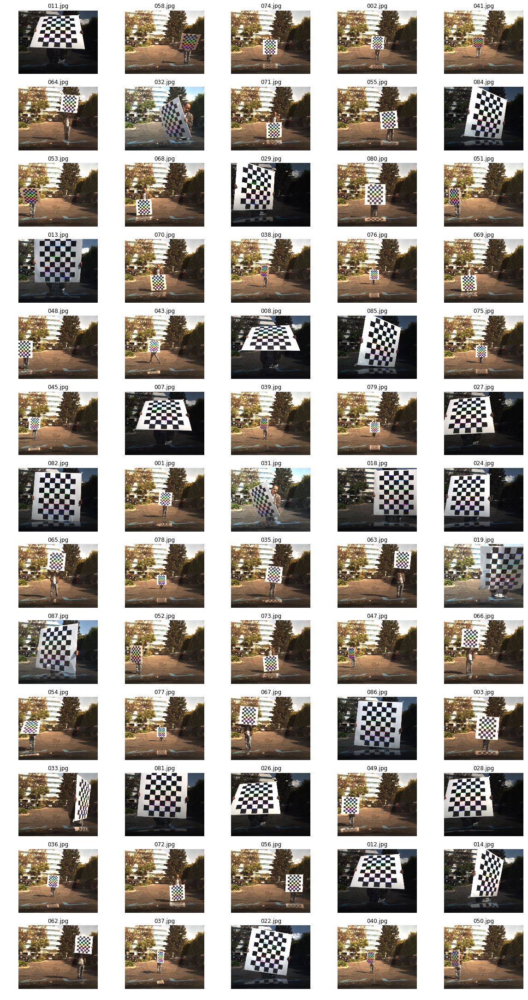

In [5]:
calib_DIR = "calib"
calib_imgs = glob.glob(os.path.join(calib_DIR,"*.jpg"))
cal = calibration()
for calib_img in calib_imgs :
    nx, ny = 6,8
    cal.add_image(calib_img, nx,ny)
cal.display_images_with_corners()

Corners not found in calib/042.jpg
Corners not found in calib/057.jpg
Corners not found in calib/015.jpg
Corners not found in calib/034.jpg
Corners not found in calib/059.jpg
Corners not found in calib/083.jpg
Corners not found in calib/030.jpg
Corners not found in calib/060.jpg
Corners not found in calib/010.jpg
Corners not found in calib/009.jpg
Corners not found in calib/016.jpg
Corners not found in calib/020.jpg
Corners not found in calib/005.jpg
Corners not found in calib/046.jpg
Corners not found in calib/021.jpg
Corners not found in calib/017.jpg
Corners not found in calib/061.jpg
Corners not found in calib/023.jpg
('RMS:', 1.3152392900200718)
('camera matrix:\n', array([[  1.35103293e+03,   0.00000000e+00,   6.11621068e+02],
       [  0.00000000e+00,   1.36150275e+03,   5.69319474e+02],
       [  0.00000000e+00,   0.00000000e+00,   1.00000000e+00]]))
('distortion coefficients: ', array([-0.1454428 ,  0.22506983,  0.00353645, -0.00618987, -0.05673468]))


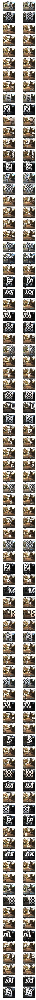

In [6]:
cal.calc_distortion()
files = glob.glob(os.path.join(calib_DIR,"*.jpg"))
cal.display_undistorted_images(files=files)